# Ayudantía 11: Análisis Multivariado

Para abrirlo en colab: <a target="_blank" href="https://githubtocolab.com/SysBioengLab/IIQ3402-Statistical-Design/blob/main/Ayudantias/Ayudantia11_AnalisisMultivariado.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_wine, load_digits

# Descargamos los datos

In [2]:
wine = load_wine(as_frame=True)
data_wine = wine.data
target_wine = wine.target
name_wine = wine.target_names # 0 -> class_0, 1 -> class_1, 2 -> class_2
digits = load_digits(as_frame=True)
data_digits = digits.data
target_digits = digits.target
name_digits = digits.target_names # Cada uno corresponde al número manuscrito

display(data_wine.head())
display(data_digits.head())

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0


,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


Visualizemos los `digits` para entender mejor que está pasando.

Text(0.5, 1.0, 'Número manuscrito: 3')

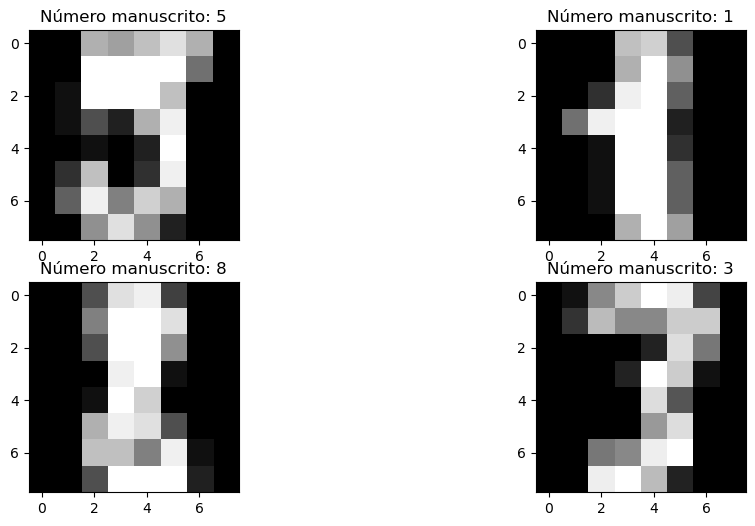

In [3]:
fig, ax = plt.subplots(2, 2, figsize=(12, 6))
ax[0,0].imshow(data_digits.loc[421].values.reshape(8, 8), cmap='gray')
ax[0,0].set_title(f'Número manuscrito: {name_digits[target_digits.loc[421]]}')

ax[0,1].imshow(data_digits.loc[1].values.reshape(8, 8), cmap='gray')
ax[0,1].set_title(f'Número manuscrito: {name_digits[target_digits.loc[1]]}')
ax[1,0].imshow(data_digits.loc[123].values.reshape(8, 8), cmap='gray')
ax[1,0].set_title(f'Número manuscrito: {name_digits[target_digits.loc[123]]}')
ax[1,1].imshow(data_digits.loc[23].values.reshape(8, 8), cmap='gray')  
ax[1,1].set_title(f'Número manuscrito: {name_digits[target_digits.loc[23]]}')

# Principal Component Analysis

## Gráficos Pareados

> Realice un gráfico pareado para evaluar las relaciones entre los parámetros. ¿Es posible en-
contrar alguna relación entre las variables del conjunto de datos? Utilice la función sns.pairplot
para facilitar el análisis
El gráfico pareado, o PairPlot, es un gráfico que permite entender relaciones entre variables.

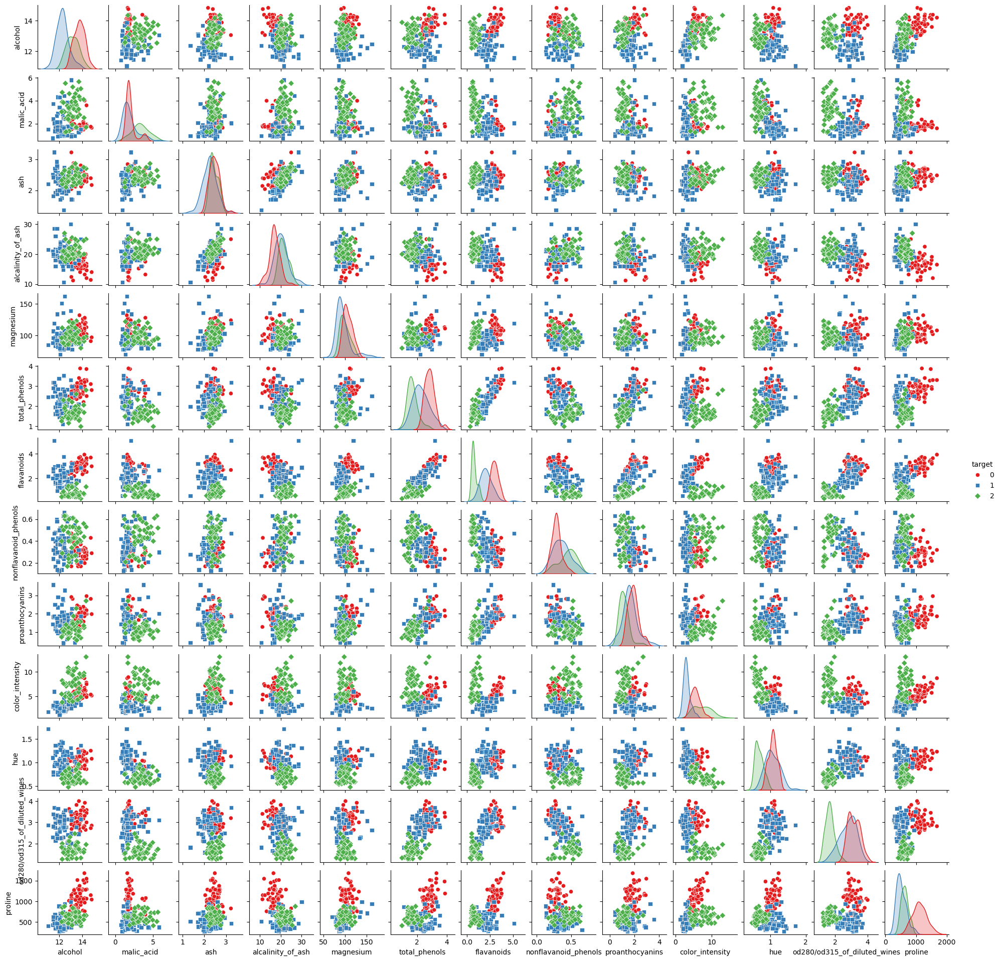

In [4]:
## Pair plot wine
dat_pair = data_wine.copy()
dat_pair['target'] = target_wine
sns.pairplot(dat_pair, hue='target', palette='Set1', markers=["o", "s", "D"], diag_kind='kde',
             height=1.5)

Podemos darnos cuenta que analizar de esta manera, datos de gran dimensionalidad es ineficiente, por lo cuál el gráfico de digits se omitirá.

# Correlogramas
> Analice la correlación entre las variables mediante un correlograma. ¿Qué conclusiones puede
extraer?

El correlograma es una forma sencilla de entender las correlaciones entre las variables. 

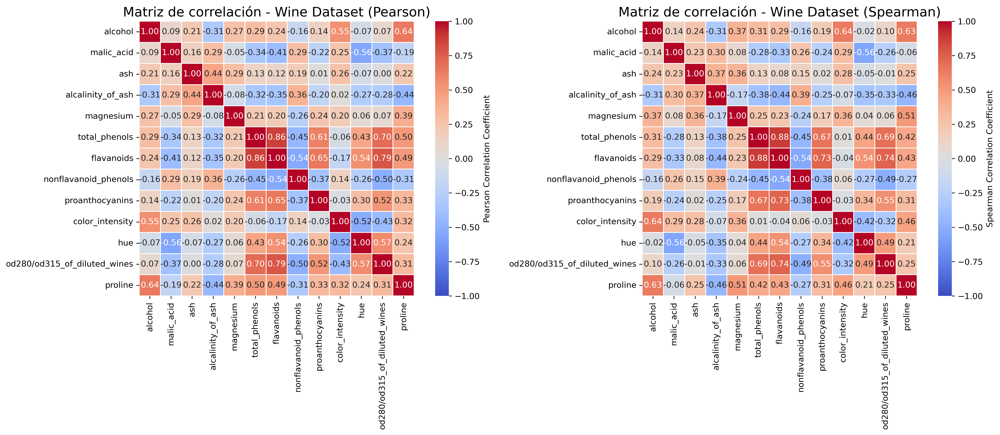

In [5]:
# Wine
fig, ax = plt.subplots(1,2,figsize=(20, 6), dpi = 300)
corr_wine = data_wine.corr()

sns.heatmap(corr_wine, annot=True, fmt=".2f", cmap='coolwarm', ax=ax[0],
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
            cbar_kws={'label': 'Pearson Correlation Coefficient'})
ax[0].set_title('Matriz de correlación - Wine Dataset (Pearson)', fontsize=16)


corr_wine = data_wine.corr(method='spearman')
sns.heatmap(corr_wine, annot=True, fmt=".2f", cmap='coolwarm', ax=ax[1],
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
            cbar_kws={'label': 'Spearman Correlation Coefficient'})

ax[1].set_title('Matriz de correlación - Wine Dataset (Spearman)', fontsize=16)
plt.show()

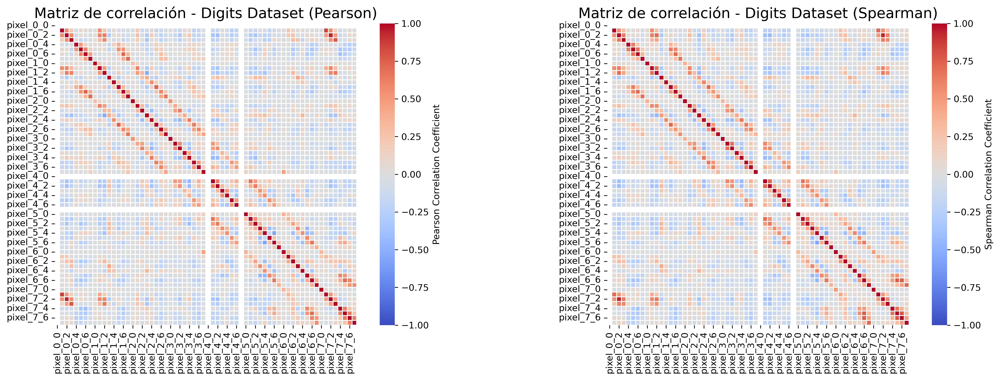

In [6]:
# Wine
fig, ax = plt.subplots(1,2,figsize=(20, 6), dpi = 300)
corr_digits = data_digits.corr()

sns.heatmap(corr_digits, annot=False, fmt=".2f", cmap='coolwarm', ax=ax[0],
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
            cbar_kws={'label': 'Pearson Correlation Coefficient'})
ax[0].set_title('Matriz de correlación - Digits Dataset (Pearson)', fontsize=16)


corr_digits = data_digits.corr(method='spearman')
sns.heatmap(corr_digits, annot=False, fmt=".2f", cmap='coolwarm', ax=ax[1],
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
            cbar_kws={'label': 'Spearman Correlation Coefficient'})

ax[1].set_title('Matriz de correlación - Digits Dataset (Spearman)', fontsize=16)
plt.show()

## Generación de PCA

>Realice una reducción de dimensionalidad utilizando PCA. Estime cuánta varianza captura
cada componente y determine cuántos componentes conservaría para análisis posteriores.

Generar los embeddings con PCA es sencillo en `python` debido a que es una técnica clasica y altamente utilizada. En este caso vamos a utilizar el paquete `pca` -debido a que permite hacer gráficos de forma más sencilla- pero se puede utilizar `sklearn.decomposition.PCA`, la cuál es la forma clásica.

Text(0.5, 1.0, 'Varianza explicada por cada componente principal - Wine Dataset')

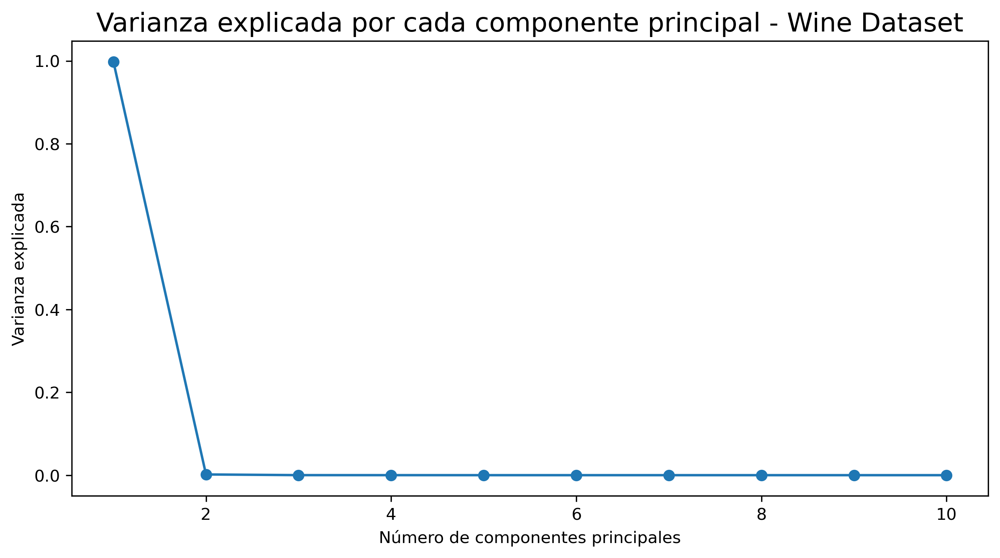

In [7]:
from pca import pca
from sklearn.decomposition import PCA
# partimos con pca de sklearn para investigar
skPCA_wine = PCA(n_components=10)
skPCA_wine.fit(data_wine)
explained_variance_wine = skPCA_wine.explained_variance_ratio_
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(1, len(explained_variance_wine) + 1), explained_variance_wine, marker='o')
ax.set_xlabel('Número de componentes principales')
ax.set_ylabel('Varianza explicada')
ax.set_title('Varianza explicada por cada componente principal - Wine Dataset', fontsize=16)

¿Qué paso aquí? 

Este es un comportamiento típico en los casos de tener variables cuyos valores son de diferente magnitud. Por ejemplo:

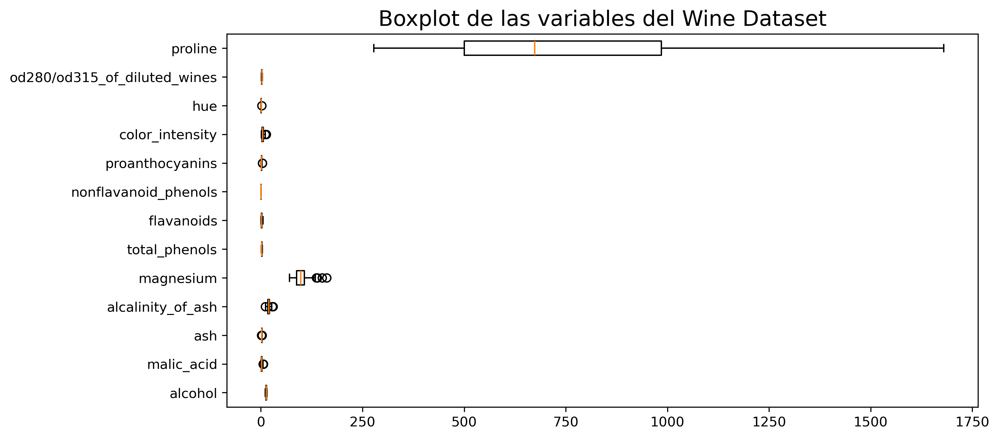

In [8]:
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.boxplot(data_wine, vert=False)
ax.set_yticklabels(data_wine.columns)
ax.set_title('Boxplot de las variables del Wine Dataset', fontsize=16)
plt.show()
# Ahora con nuestro PCA

Podemos ver entonces como la variable `proline` es la que posee la mayor varianza y magnitud, así, los componentes principales explican mayoritariamente la varianza de esta variable. Para solucionar este problema se utiliza una técnica llamada `normalización` o `estandarización`.

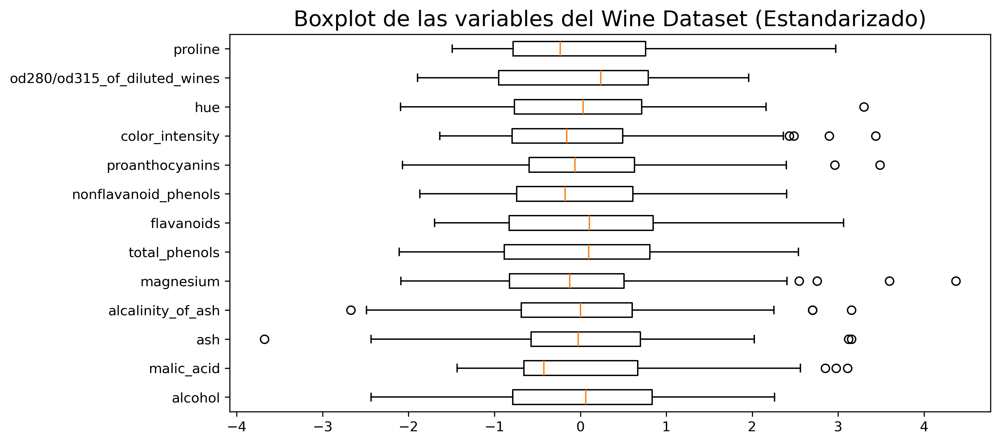

In [9]:
from sklearn.preprocessing import StandardScaler
wine_scaler = StandardScaler()
wine_standard = pd.DataFrame(wine_scaler.fit_transform(data_wine), columns=data_wine.columns)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.boxplot(wine_standard, vert=False)
ax.set_yticklabels(wine_standard.columns)
ax.set_title('Boxplot de las variables del Wine Dataset (Estandarizado)', fontsize=16)
plt.show()

Ahora podemos ver como la varianza se distribuye de forma "equitativa" entre las variables. 
Repitamos el procedimiento.

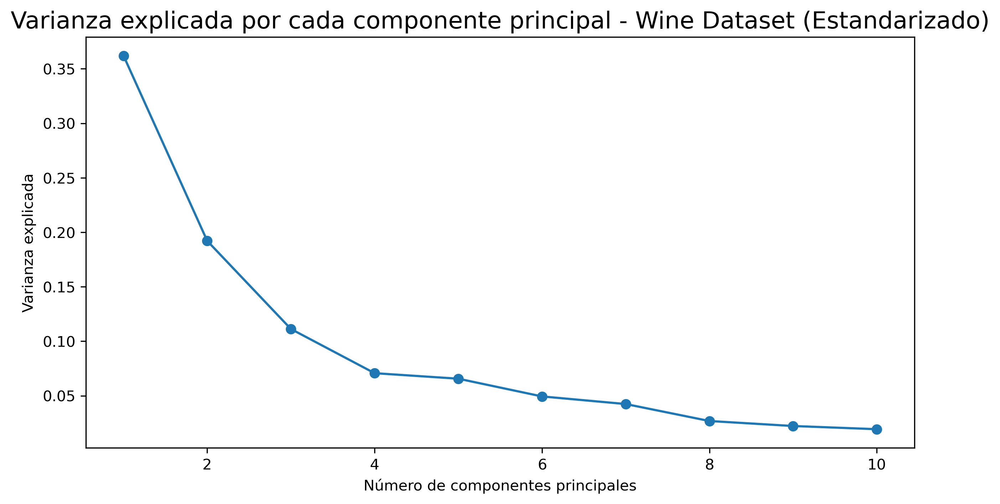

In [10]:
skPCA_wine_standar = PCA(n_components=10)
skPCA_wine_standar.fit(wine_standard)
explained_variance_wine_standar = skPCA_wine_standar.explained_variance_ratio_
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(1, len(explained_variance_wine_standar) + 1), explained_variance_wine_standar, marker='o')
ax.set_xlabel('Número de componentes principales')
ax.set_ylabel('Varianza explicada')
ax.set_title('Varianza explicada por cada componente principal - Wine Dataset (Estandarizado)', fontsize=16)
plt.show()

Ahora podemos ver como los componentes principales capturan el comportamiento de los datos de forma fidedigna. Esto demuestra la importancia de normalizar los datos previo a el análisis PCA.

[pca] >Extracting column labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [13] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[13]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


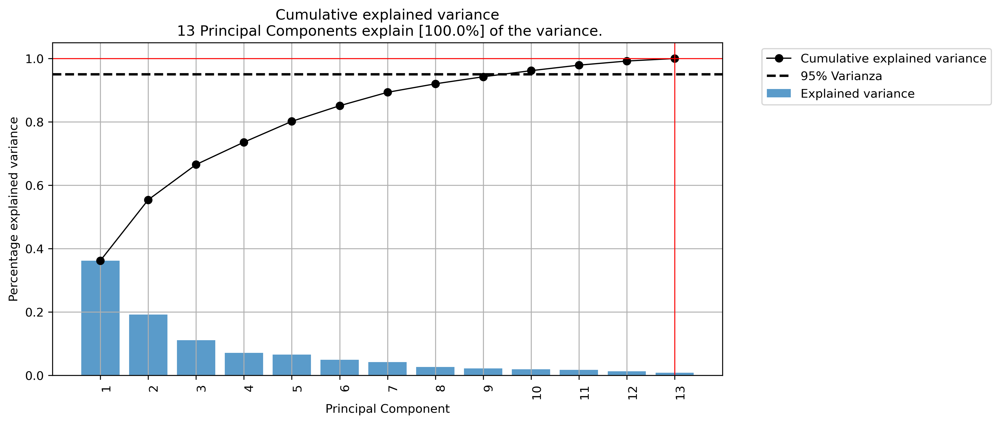

In [11]:
pca_wine = pca(n_components=data_wine.shape[1],
               normalize=True) # por defecto al libreria pca permite normalizar los datos
pca_data_wine = pca_wine.fit_transform(data_wine, target_wine)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
pca_wine.plot(ax = ax)
ax.axhline(y=0.95, color='k', linestyle='--', linewidth=2, label = '95% Varianza')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed on the [64] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[50]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


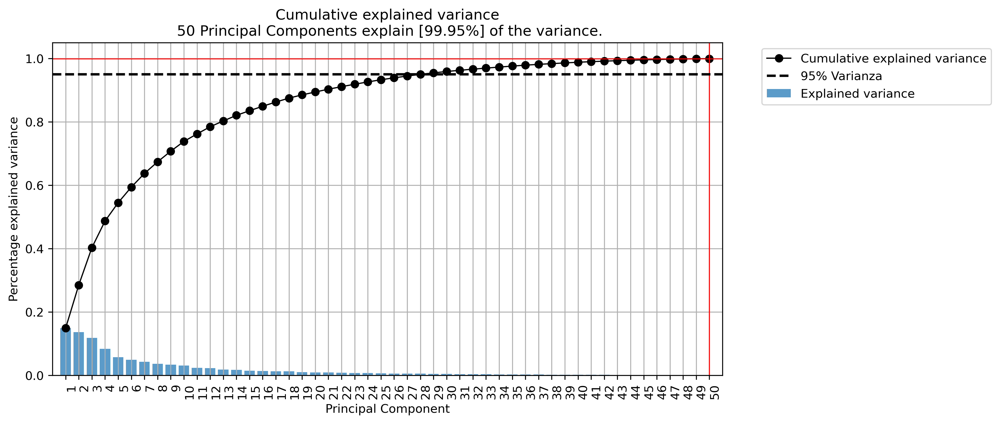

In [12]:
pca_digists = pca(n_components=50,
               normalize=False) # por defecto al libreria pca permite normalizar los datos
pca_data_digits = pca_digists.fit_transform(data_digits)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
pca_digists.plot(ax = ax)
ax.axhline(y=0.95, color='k', linestyle='--', linewidth=2, label = '95% Varianza')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')# 

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [64] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[50]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


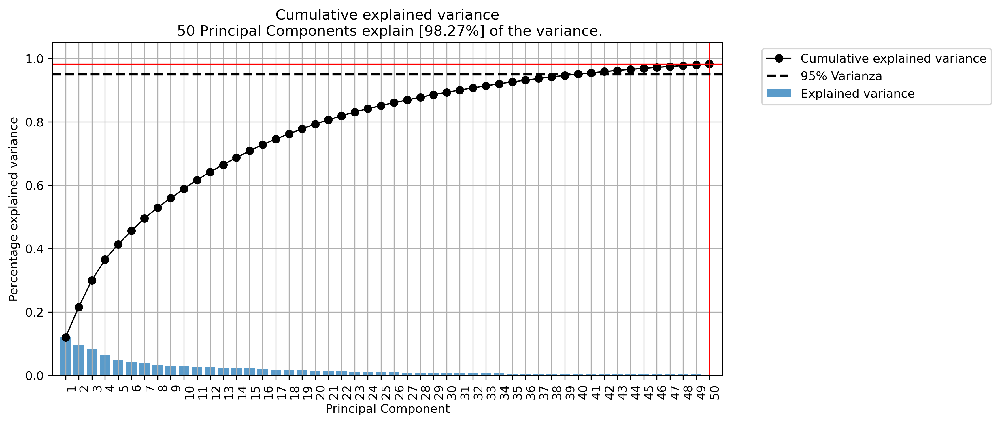

In [13]:
pca_digists = pca(n_components=50,
               normalize=True) # por defecto al libreria pca permite normalizar los datos
pca_data_digits = pca_digists.fit_transform(data_digits)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
pca_digists.plot(ax = ax)
ax.axhline(y=0.95, color='k', linestyle='--', linewidth=2, label = '95% Varianza')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')# 

# Biplot

> Grafique los componentes principales e interprete los resultados. A la vez, visualice los loadings utilizando un biplot

[11-06-2025 12:52:09] [scatterd.scatterd] [INFO] Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '13 Principal Components explain [100.0%] of the variance'}, xlabel='PC1 (36.1% expl.var)', ylabel='PC2 (19.2% expl.var)'>)

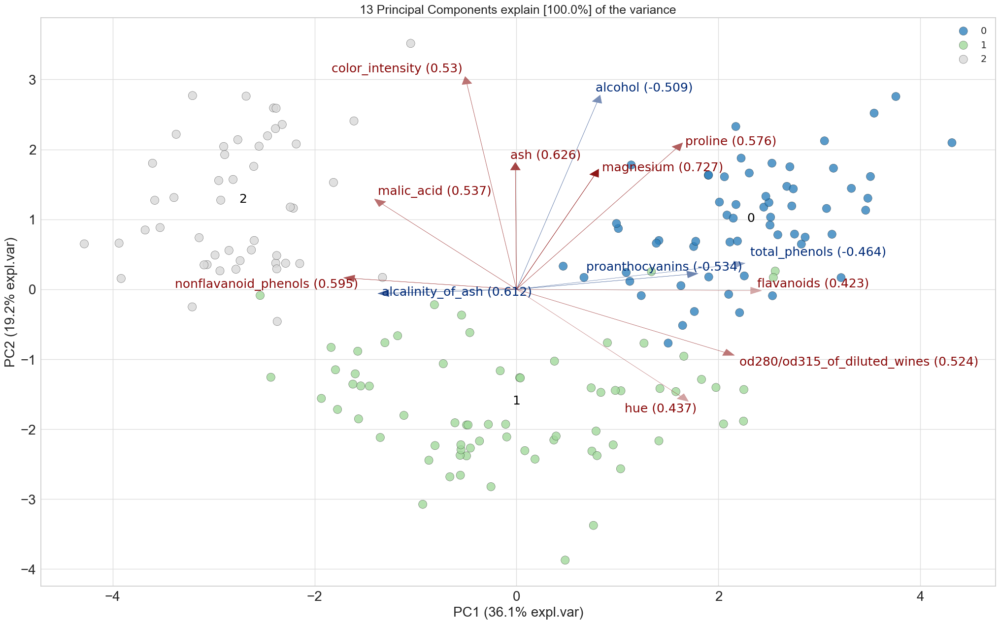

In [113]:
pca_wine.biplot()

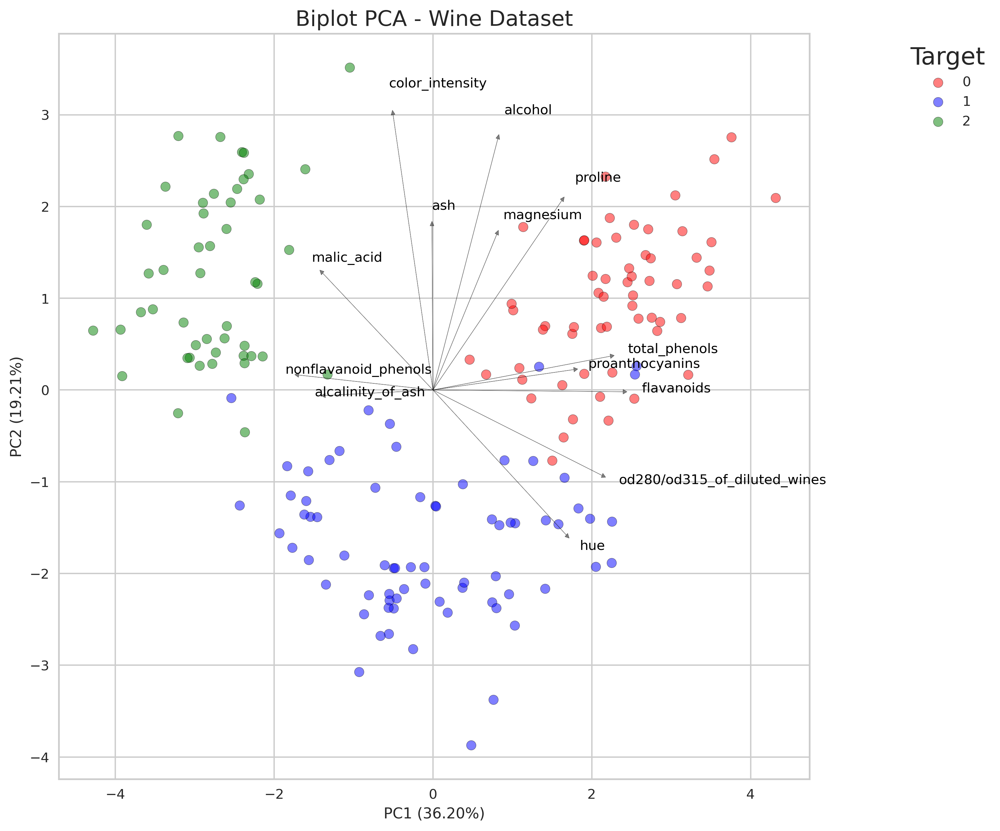

In [ ]:
# CODIGO POR SI QUIEREN ENTENDER QUE PASA POR DETRAS Y QUIEREN MODIFICARLO
from sklearn.preprocessing import minmax_scale
fig, ax = plt.subplots(1,figsize=(10, 10), dpi = 300)

pca_data_wine_target = pca_data_wine['PC'].copy()
pca_data_wine_target['target'] = target_wine.values
loadings = pca_data_wine['loadings'].copy()
colors = ['red', 'blue', 'green']
for c, targ in enumerate(pca_data_wine_target['target'].unique()):
    unique_target = pca_data_wine_target[pca_data_wine_target['target'] == targ]
    ax.scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.5, edgecolor='black')
scaling_factor = 3.0 / np.max(np.abs(loadings.loc[['PC1', 'PC2']].values))
loadings.loc[['PC1', 'PC2']] *= scaling_factor
for i, col in enumerate(loadings.columns):
    ax.arrow(0, 0, loadings[col]['PC1'], loadings[col]['PC2'], 
             color='black', alpha=0.5, head_width=0.05, head_length=0.05)
    ax.text(loadings[col]['PC1']*1.1, loadings[col]['PC2']*1.1, col, 
            color='black', fontsize=10)

explaine_var_wine = pca_data_wine['explained_var']
ax.set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax.set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax.set_title('Biplot PCA - Wine Dataset', fontsize=16)
ax.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

Para los datos de `digits` no graficaremos los loadings por claras razones.

> Repita los procedimientos anteriores con el conjunto de datos digits. ¿Qué observa en los
gráficos resultantes?

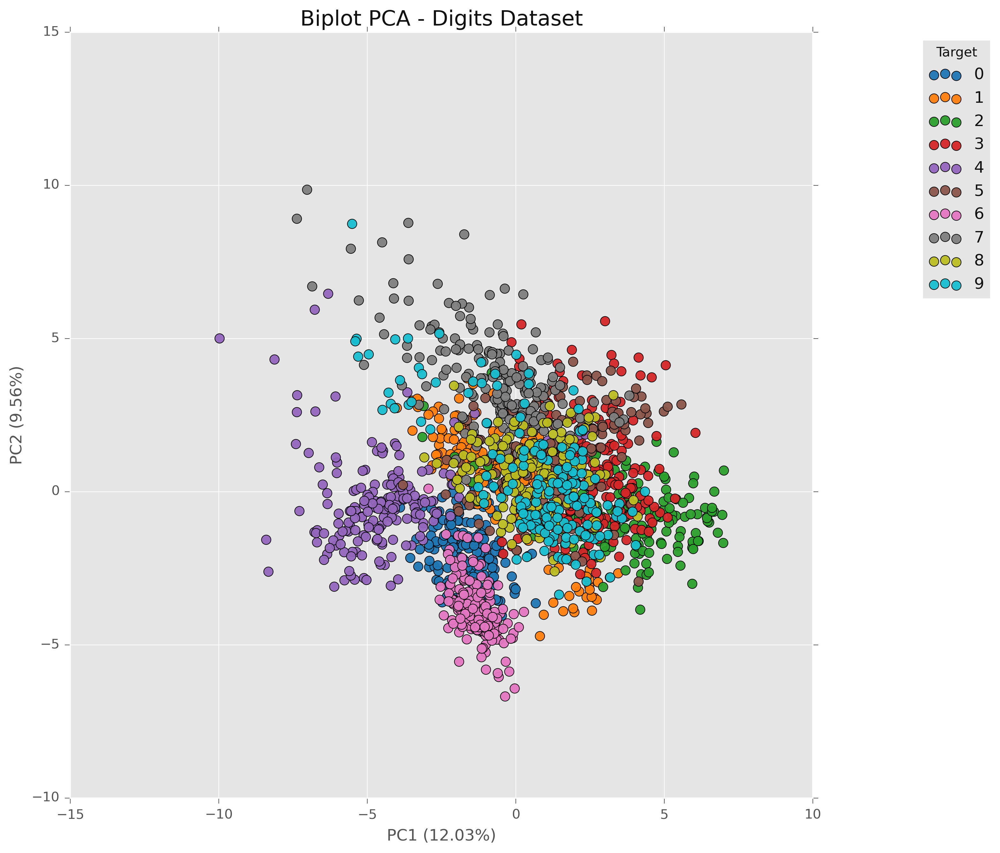

In [119]:
# ahora con digits without the loadings
import matplotlib.style
import matplotlib as mpl


fig, ax = plt.subplots(1,figsize=(10, 10), dpi = 300)
pca_data_digits_target = pca_data_digits['PC'].copy()
pca_data_digits_target['target'] = target_digits.values
colors = sns.color_palette("tab10", len(pca_data_digits_target['target'].unique()))
for c, targ in enumerate(pca_data_digits_target['target'].unique()):
    unique_target = pca_data_digits_target[pca_data_digits_target['target'] == targ]
    ax.scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
explaine_var_digits = pca_data_digits['explained_var']
ax.set_xlabel('PC1' + f' ({explaine_var_digits[0]:.2%})')
ax.set_ylabel('PC2' + f' ({explaine_var_digits[1] - explaine_var_digits[0] :.2%})')
ax.set_title('Biplot PCA - Digits Dataset', fontsize=16)
ax.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()


Es interasante notar la diferencia que está presente en ambas situaciones.
El dataset de `wine` presenta grupos de forma notoria, mientras que `digits` es complejo poder separar los datos.


# Reducción de Dimensión No-Lineal

>Investigue las técnicas t-SNE y UMAP y genere el embedding de los datos digits. ¿Qué
precauciones debe tener en cuenta al aplicar estas técnicas?

La siguiente sección haremos un embedding de los datos `digits` con técnicas más sofisticadas. Para facilidad solo se dara solo una noción de las técnicas. Para mayor información pueden leer:
- tSNE: https://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf?fbcl
- UMAP: https://umap-learn.readthedocs.io/en/latest/basic_usage.html

A grandes rasgos, ambos métodos se encargan de visualizar los datos en espacios de menor dimensión. tSNE toma una perspectiva estadística, al disminuir la divergencia entre las distribuciones de distancias de cada punto. Por otro lado, UMAP, se basa más en la captura de la topología de los datos. **A grandes rasgos**.

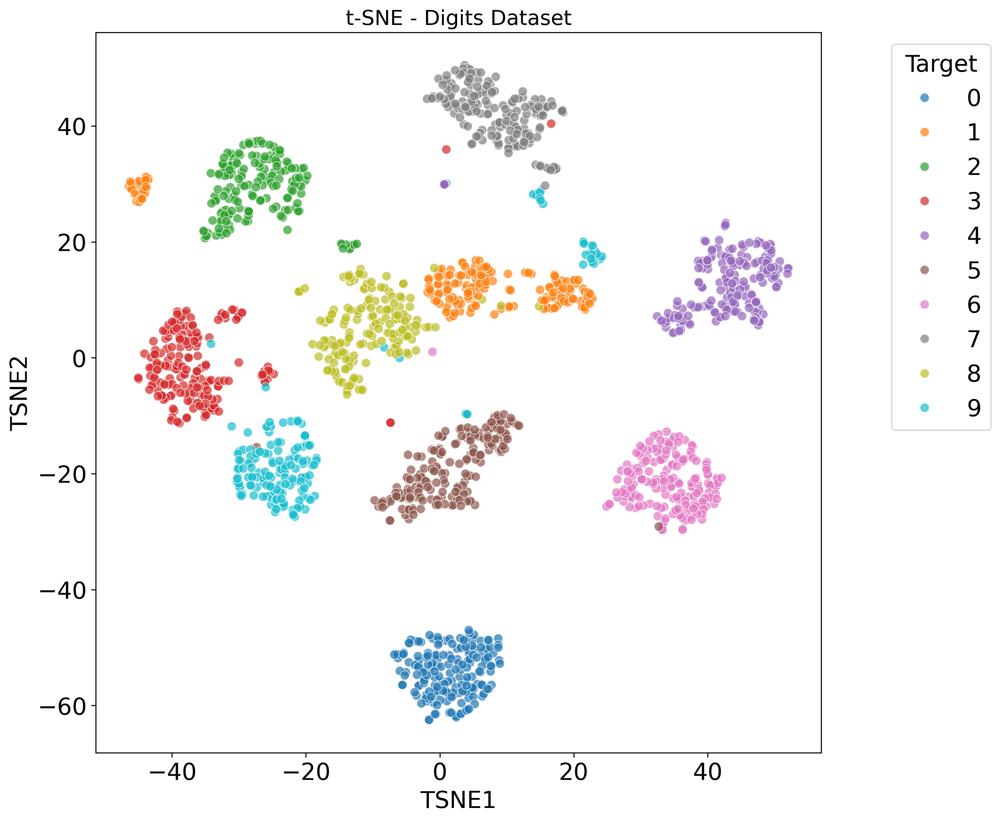

In [24]:
from sklearn.manifold import TSNE

# para digits
tsne_digits = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_data_digits = tsne_digits.fit_transform(data_digits)
tsne_data_digits = pd.DataFrame(tsne_data_digits, columns=['TSNE1', 'TSNE2'])
tsne_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=tsne_data_digits, x='TSNE1', y='TSNE2', hue='target', palette='tab10', ax=ax, s=50, alpha=0.7)
ax.set_title('t-SNE - Digits Dataset', fontsize=16)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


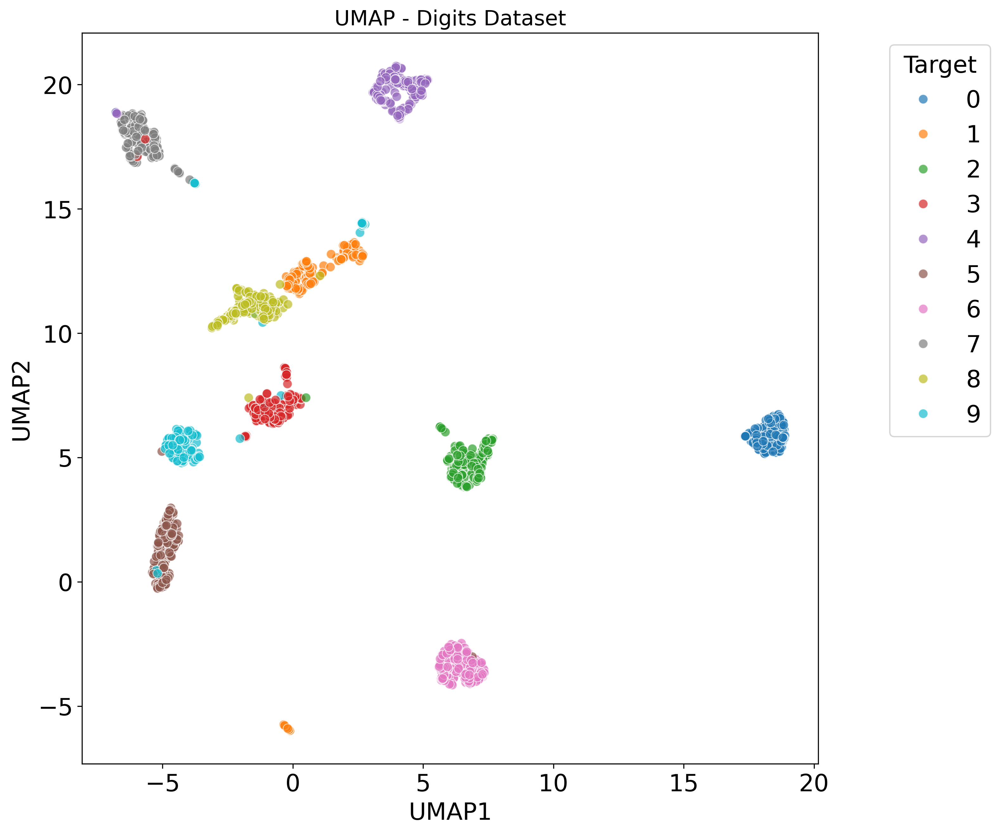

In [25]:
# UMAP digits
import umap
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(data_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=umap_data_digits, x='UMAP1', y='UMAP2', hue='target', palette='tab10', ax=ax, s=50, alpha=0.7)
ax.set_title('UMAP - Digits Dataset', fontsize=16)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

También funciona bien con el set de datos de Wine -al menos UMAP.

/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


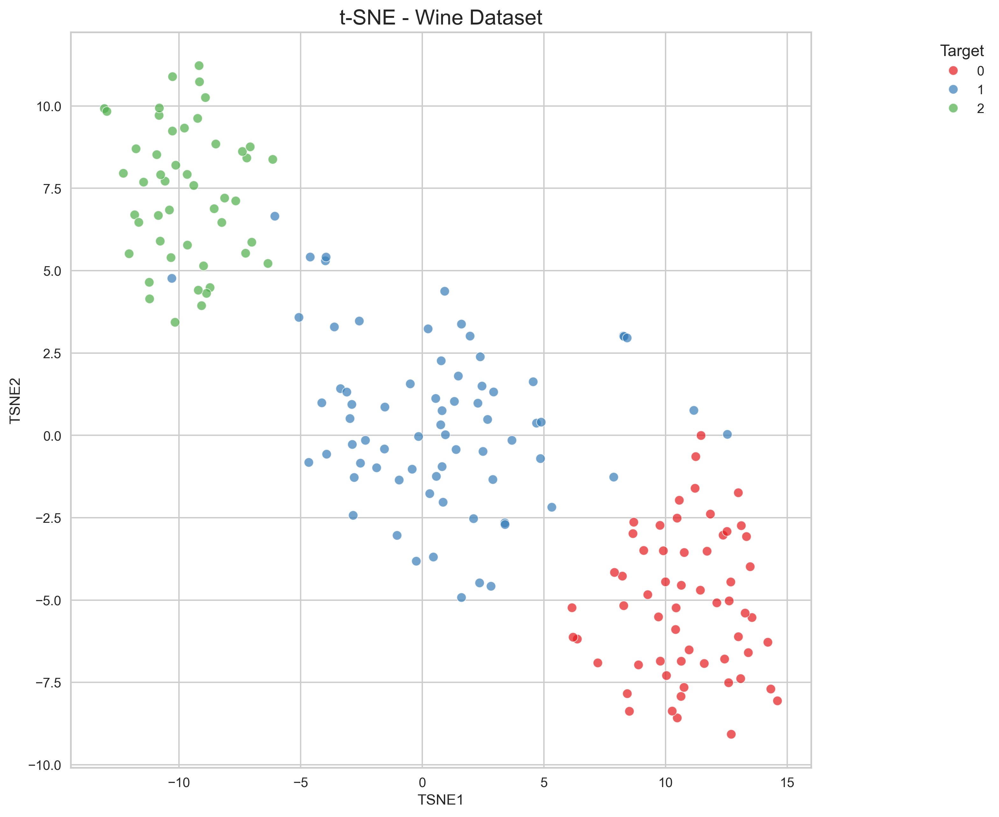

In [103]:
tsne_wine = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
standard_wine = pd.DataFrame(StandardScaler().fit_transform(data_wine), columns=data_wine.columns)

tsne_data_wine = tsne_wine.fit_transform(standard_wine)
tsne_data_wine = pd.DataFrame(tsne_data_wine, columns=['TSNE1', 'TSNE2'])
tsne_data_wine['target'] = target_wine.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=tsne_data_wine, x='TSNE1', y='TSNE2', hue='target', palette='Set1', ax=ax, s=50, alpha=0.7)
ax.set_title('t-SNE - Wine Dataset', fontsize=16)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))

/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


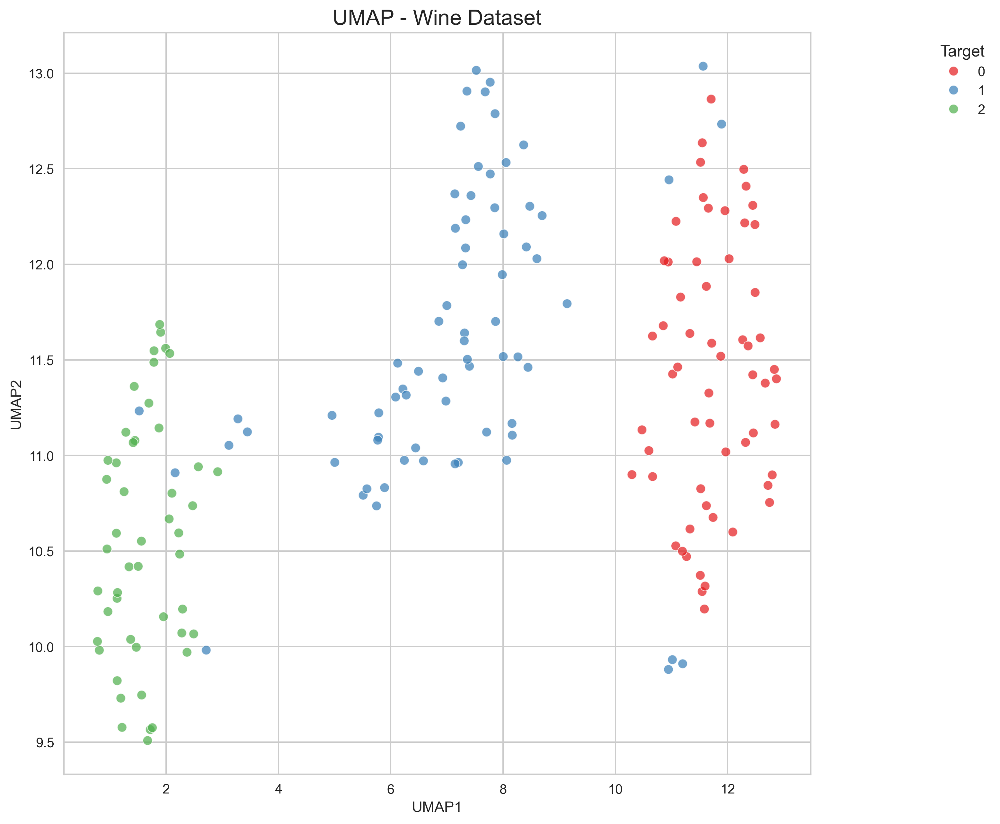

In [101]:
umap_wine = umap.UMAP(n_components=2, random_state=42)
standard_wine = pd.DataFrame(StandardScaler().fit_transform(data_wine), columns=data_wine.columns)

umap_data_wine = umap_wine.fit_transform(standard_wine)
umap_data_wine = pd.DataFrame(umap_data_wine, columns=['UMAP1', 'UMAP2'])
umap_data_wine['target'] = target_wine.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=umap_data_wine, x='UMAP1', y='UMAP2', hue='target', palette='Set1', ax=ax, s=50, alpha=0.7)
ax.set_title('UMAP - Wine Dataset', fontsize=16)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

# Técnicas de Agrupamiento

## K-Means

>Utilizando el método del Codo (Elbow Method) y el método de Silueta promedio (Silhouette
Score), determine la cantidad óptima de grupos para los datos wine y digits.

K-means es un algoritmo de agrupamiento basado en encontrar centroides -centros- de los datos y mediante la distancia a estos centroides se definen los grupos encontrados. La ventaja de este algoritmo es que es sencillo y permite interpretar los grupos con facilidad.

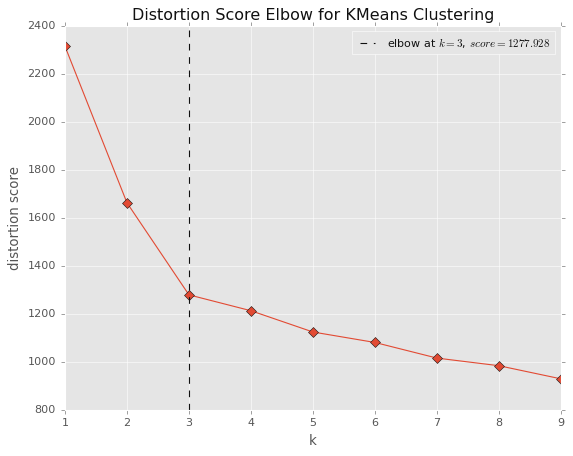

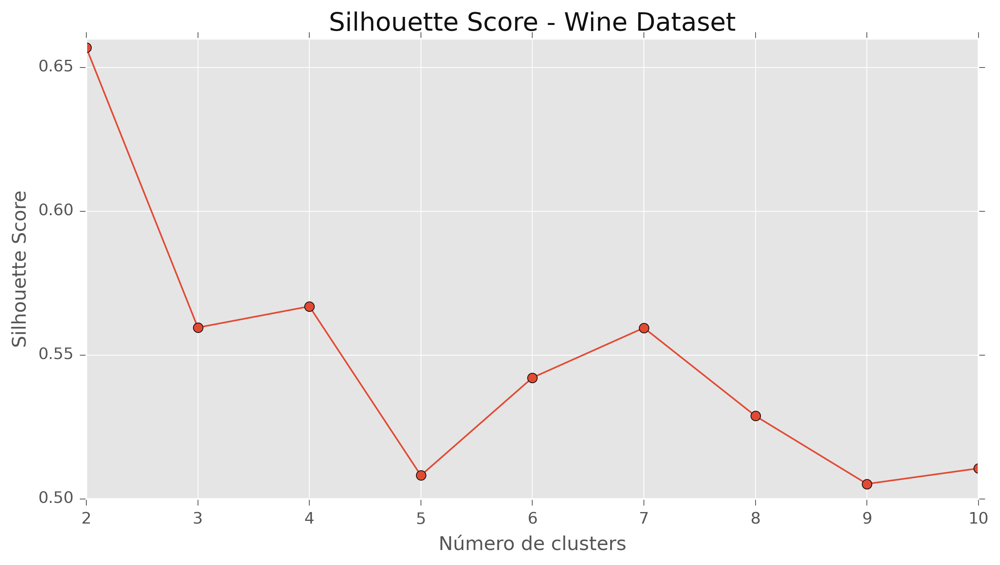

In [121]:
import yellowbrick as yb
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.metrics import silhouette_score 
# KMeans para wine
standard_wine = pd.DataFrame(StandardScaler().fit_transform(data_wine), columns=data_wine.columns)
kmeans_wine = KMeans(random_state=42)
visualizer_wine = kelbow_visualizer(kmeans_wine, standard_wine, k=(1, 10), timings=False,)
visualizer_wine.fit(data_wine)
visualizer_wine.show()
# siljouette para wine 
silhouette_kmenas = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_wine)
    score = silhouette_score(data_wine, kmeans.labels_)
    silhouette_kmenas.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(2, 11), silhouette_kmenas, marker='o')
ax.set_xlabel('Número de clusters')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Wine Dataset', fontsize=16)
plt.show()

Mediante los grupos podemos ver que existen entre k=3 y k=4 grupos. Analicemos cuál podría ser el mejor.

[pca] >Extracting column labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [13] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


Text(0.5, 1.0, 'Biplot PCA - Wine Dataset con KMeans')

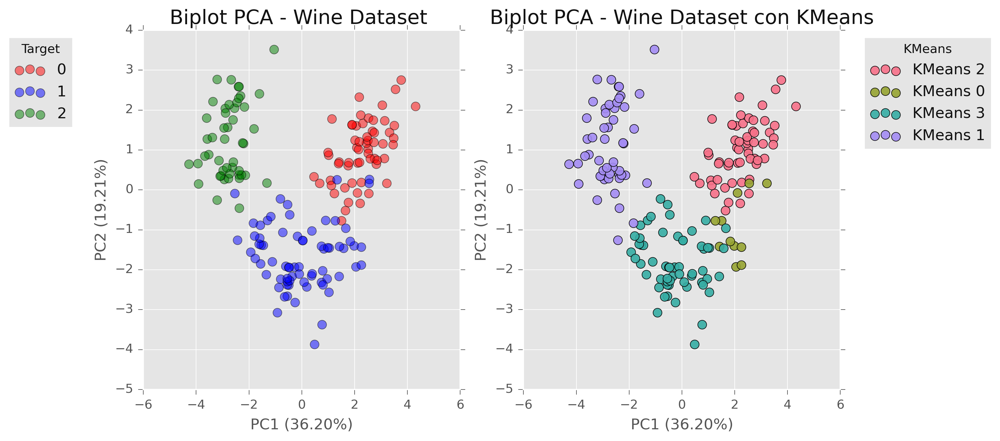

In [122]:
# k = 4
kmeans_wine = KMeans(n_clusters=4, random_state=42)
kmeans_wine.fit(standard_wine)
pca_wine_kmeans = pca(n_components=2, normalize=True)
pca_data_wine = pca_wine_kmeans.fit_transform(standard_wine, kmeans_wine.labels_)
pca1_pc2 = pca_data_wine['PC'].copy()
pca1_pc2['target-kmean'] = kmeans_wine.labels_
pca1_pc2['target'] = target_wine.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = ['red', 'blue', 'green']
for c, targ in enumerate(pca1_pc2['target'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target'] == targ]
    ax[0].scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.5, edgecolor='black')
ax[0].set_xlabel('PC1' + f' ({pca_data_wine["explained_var"][0]:.2%})')
ax[0].set_ylabel('PC2' + f' ({pca_data_wine["explained_var"][1] - pca_data_wine["explained_var"][0] :.2%})')
ax[0].set_title('Biplot PCA - Wine Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.2, 1))
colors = sns.color_palette("husl", len(pca1_pc2['target-kmean'].unique()))
for c, targ in enumerate(pca1_pc2['target-kmean'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target-kmean'] == targ]
    ax[1].scatter(unique_target['PC1'], unique_target['PC2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine['explained_var']
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[1].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[1].set_title('Biplot PCA - Wine Dataset con KMeans', fontsize=16)
# KMeans para digits

[pca] >Extracting column labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [13] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


Text(0.5, 1.0, 'Biplot PCA - Wine Dataset con KMeans')

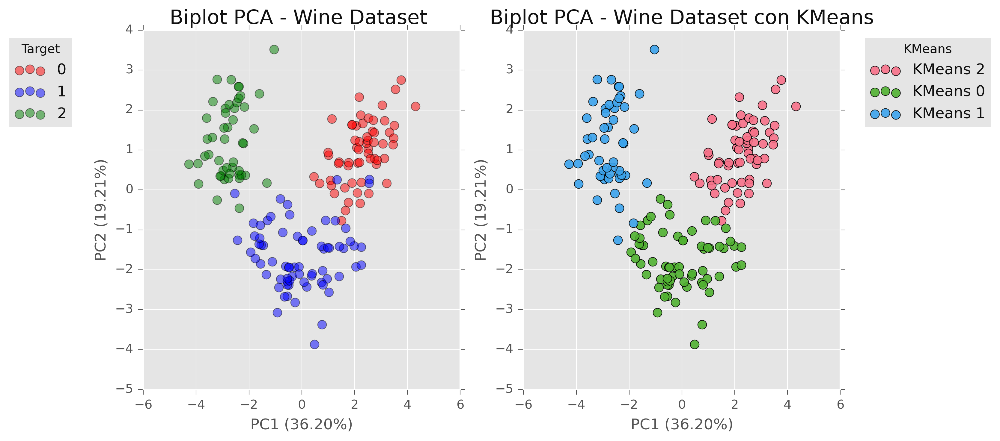

In [123]:
# k = 3 wine
# k = 4
kmeans_wine = KMeans(n_clusters=3, random_state=42)
kmeans_wine.fit(standard_wine)
pca_wine_kmeans = pca(n_components=2, normalize=True)
pca_data_wine = pca_wine_kmeans.fit_transform(standard_wine, kmeans_wine.labels_)
pca1_pc2 = pca_data_wine['PC'].copy()
pca1_pc2['target-kmean'] = kmeans_wine.labels_
pca1_pc2['target'] = target_wine.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = ['red', 'blue', 'green']
for c, targ in enumerate(pca1_pc2['target'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target'] == targ]
    ax[0].scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.5, edgecolor='black')
ax[0].set_xlabel('PC1' + f' ({pca_data_wine["explained_var"][0]:.2%})')
ax[0].set_ylabel('PC2' + f' ({pca_data_wine["explained_var"][1] - pca_data_wine["explained_var"][0] :.2%})')
ax[0].set_title('Biplot PCA - Wine Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.2, 1))
colors = sns.color_palette("husl", len(pca1_pc2['target-kmean'].unique()))
for c, targ in enumerate(pca1_pc2['target-kmean'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target-kmean'] == targ]
    ax[1].scatter(unique_target['PC1'], unique_target['PC2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine['explained_var']
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[1].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[1].set_title('Biplot PCA - Wine Dataset con KMeans', fontsize=16)
# KMeans para digits

Podemos ver como los 3 grupos son los mejores, a pesar de que no fueron detectados por el análisis de Elbow. En este caso, el análisis de codo es el mejor. 

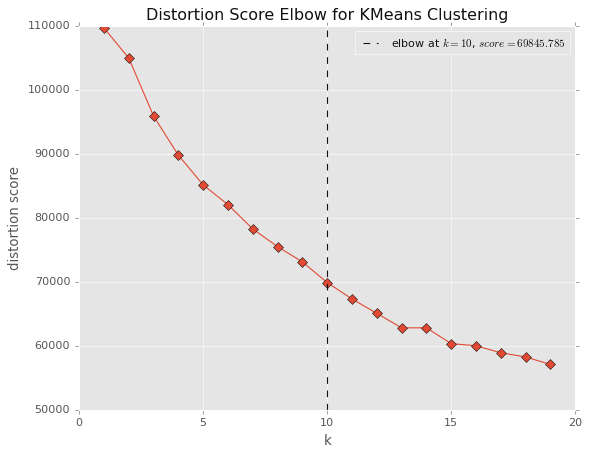

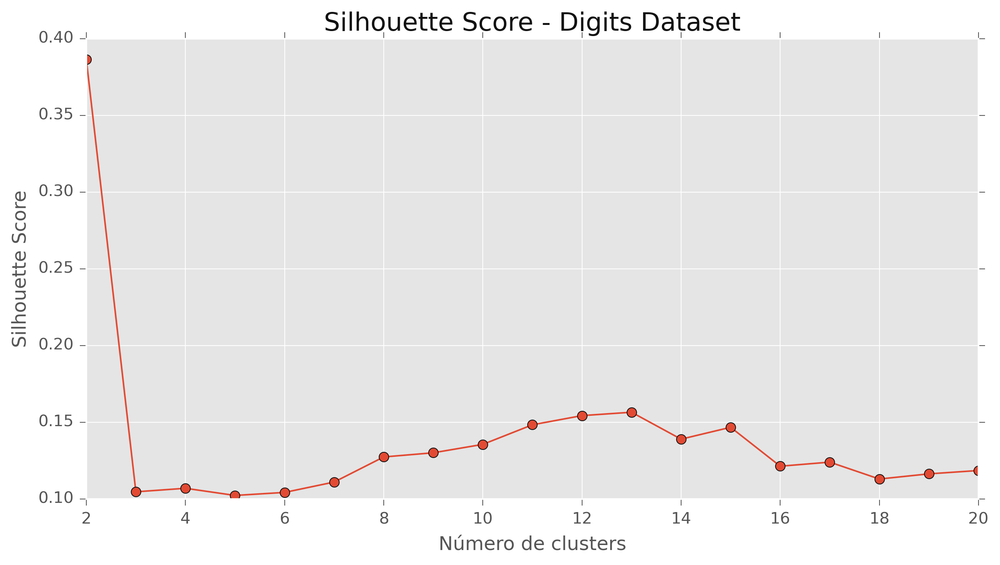

In [124]:
# elbow method para digits
kmeans_digits = KMeans(random_state=42)
standard_digits = pd.DataFrame(StandardScaler().fit_transform(data_digits), columns=data_digits.columns)
visualizer_digits = kelbow_visualizer(kmeans_digits, standard_digits, k=(1, 20), timings=False)
visualizer_digits.fit(standard_digits)
visualizer_digits.show()
# silhouette para digits
silhouette_kmenas_digits = []
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(standard_digits)
    score = silhouette_score(standard_digits, kmeans.labels_)
    silhouette_kmenas_digits.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(2, 21), silhouette_kmenas_digits, marker='o')
ax.set_xlabel('Número de clusters')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Digits Dataset', fontsize=16)
plt.show()

En este caso, el análisis de el codo nos indica un k=10, mientras que el de silueta k=13. 

/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


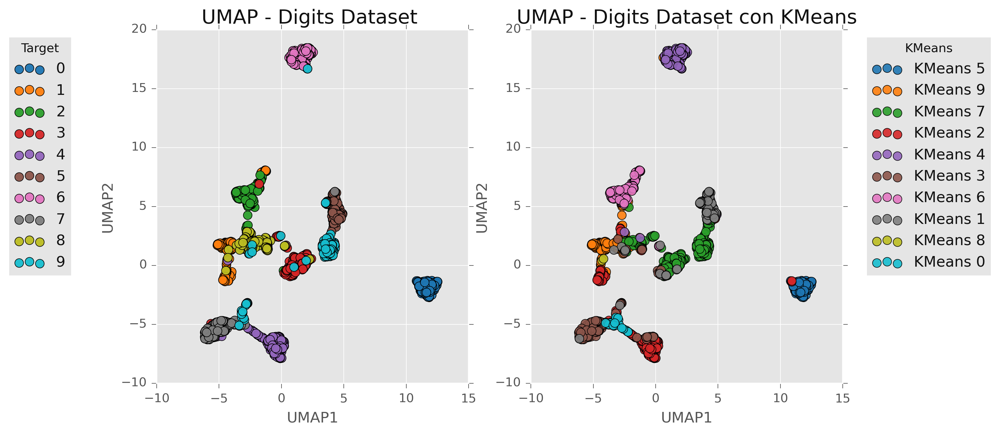

In [125]:
# Biplot Digits k = 10 y umap para embeddings
kmeans_digits = KMeans(n_clusters=10, random_state=42)
kmeans_digits.fit(standard_digits)
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(standard_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target-kmean'] = kmeans_digits.labels_
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = sns.color_palette("tab10", len(umap_data_digits['target'].unique()))
for c, targ in enumerate(umap_data_digits['target'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target'] == targ]
    ax[0].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.25, 1))
ax[0].set_xlabel('UMAP1')
ax[0].set_ylabel('UMAP2')
ax[0].set_title('UMAP - Digits Dataset ', fontsize=16)

colors = sns.color_palette("tab10", len(umap_data_digits['target-kmean'].unique()))
for c, targ in enumerate(umap_data_digits['target-kmean'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-kmean'] == targ]
    ax[1].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black')
explaine_var_digits = umap_data_digits['explained_var'] if 'explained_var' in umap_data_digits else [0.0, 0.0]
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('UMAP1')
ax[1].set_ylabel('UMAP2')
ax[1].set_title('UMAP - Digits Dataset con KMeans', fontsize=16)
plt.show()

/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


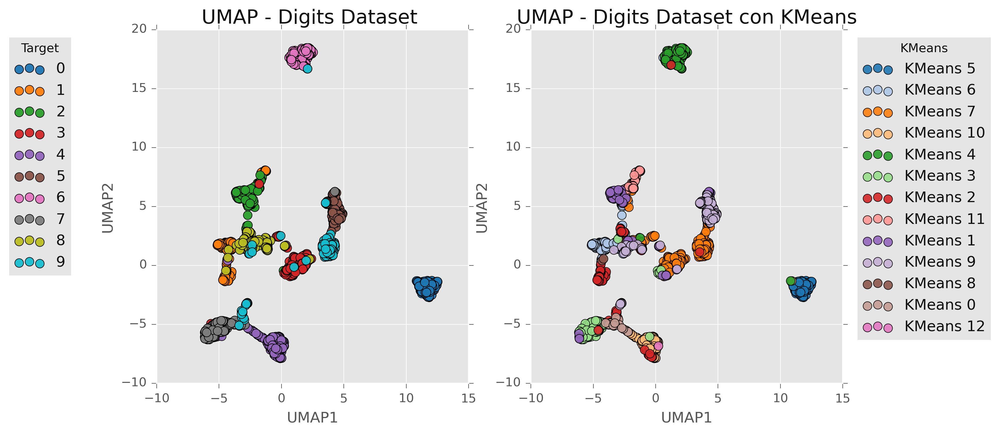

In [127]:
# k = 13
kmeans_digits = KMeans(n_clusters=13, random_state=42)
kmeans_digits.fit(standard_digits)
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(standard_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target-kmean'] = kmeans_digits.labels_
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = sns.color_palette("tab10", len(umap_data_digits['target'].unique()))
for c, targ in enumerate(umap_data_digits['target'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target'] == targ]
    ax[0].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.25, 1))
ax[0].set_xlabel('UMAP1')
ax[0].set_ylabel('UMAP2')
ax[0].set_title('UMAP - Digits Dataset ', fontsize=16)
colors = sns.color_palette("tab20", len(umap_data_digits['target-kmean'].unique()))
for c, targ in enumerate(umap_data_digits['target-kmean'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-kmean'] == targ]
    ax[1].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black')
explaine_var_digits = umap_data_digits['explained_var'] if 'explained_var' in umap_data_digits else [0.0, 0.0]
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('UMAP1')
ax[1].set_ylabel('UMAP2')
ax[1].set_title('UMAP - Digits Dataset con KMeans', fontsize=16)
plt.show()

Con análisis visual, es posible darnos cuenta que un k = 10 es el más adecuado, junto a que este agrupamiento calza con la cantidad de digitos en el set de datos.

## Agrupamiento Jerárquico

### Dendrogramas

> Visualice los dendrogramas para los agrupamientos de los datos wine y digits.

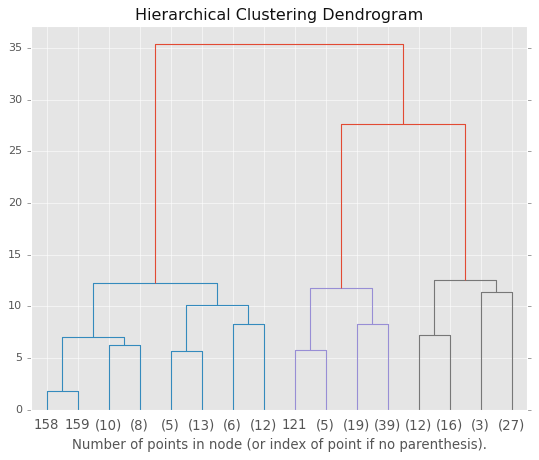

In [128]:
# silhouette para wine
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import load_iris


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


X = standard_wine.values

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

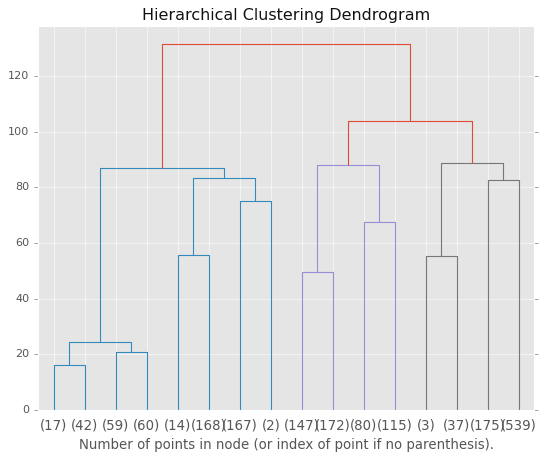

In [129]:
# silhouette para wine
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import load_iris


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


X = standard_digits.values

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

### Agrupamiento

> Identifique el mejor número de grupos. Grafique el Silhouette Score en función del
número de clusters y determine el óptimo.

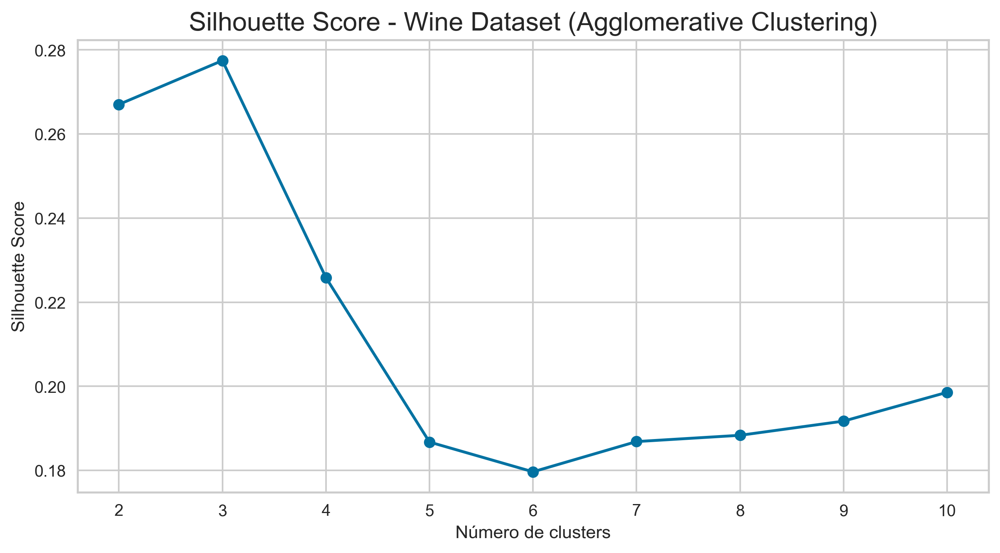

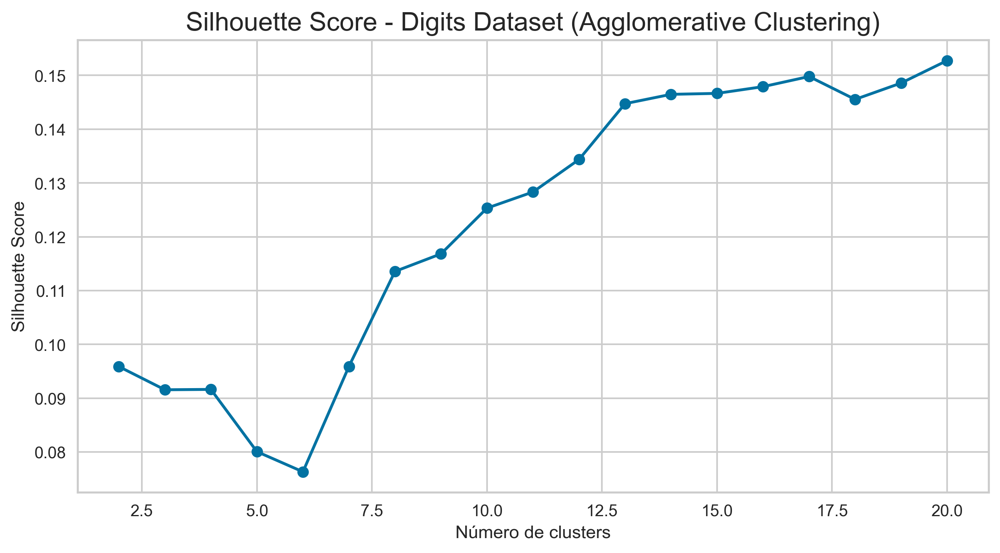

In [69]:
# argupamientos wine

from sklearn.cluster import AgglomerativeClustering
silh_agg_wine = []
for k in range(2, 11):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(standard_wine)
    score = silhouette_score(standard_wine, agg.labels_)
    silh_agg_wine.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(2, 11), silh_agg_wine, marker='o')
ax.set_xlabel('Número de clusters')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Wine Dataset (Agglomerative Clustering)', fontsize=16)
plt.show()
# argupamientos digits
silh_agg_digits = []    
for k in range(2, 21):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(standard_digits)
    score = silhouette_score(standard_digits, agg.labels_)
    silh_agg_digits.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(2, 21), silh_agg_digits, marker='o')
ax.set_xlabel('Número de clusters')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Digits Dataset (Agglomerative Clustering)', fontsize=16)
plt.show()

> Visualice los grupos utilizando PCA para wine y UMAP para digits. Compare con
las etiquetas reales

A partir de los gráficos de silueta nos quedamos con 
k = 3 para Wine 
k = 17 para Digits

Comparemos los diferentes grupos que se generan en esta instancia.

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [13] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


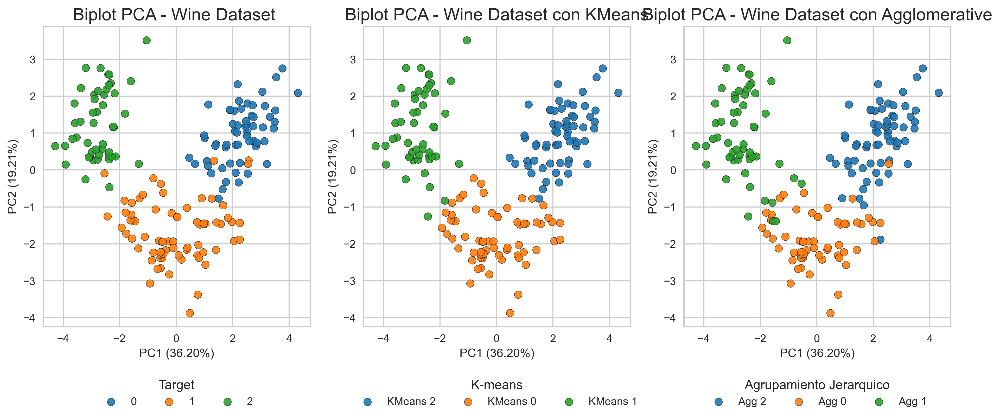

In [111]:
# wine k = 3 kmeans y k = 3 agglomerative
agg_wine = AgglomerativeClustering(n_clusters=3)
kmeans_wine = KMeans(n_clusters=3, random_state=42) # sabemos que k = 3 es bueno por el elbow y silhouette
kmeans_wine.fit(standard_wine)
agg_wine.fit(standard_wine)
pca_wine_agg = pca(n_components=2, normalize=True)
pca_data_wine_agg = pca_wine_agg.fit_transform(standard_wine)
pca_data_wine_targets = pca_data_wine_agg['PC'].copy()
pca_data_wine_targets['target-kmean'] = kmeans_wine.labels_
pca_data_wine_targets['target-agg'] = agg_wine.labels_
pca_data_wine_targets['target'] = target_wine.values
fig, ax = plt.subplots(1,3 ,figsize=(15, 5), dpi = 300)
colors = sns.color_palette("tab10", len(pca_data_wine_targets['target'].unique()))
for c, targ in enumerate(pca_data_wine_targets['target'].unique()):
    unique_target = pca_data_wine_targets[pca_data_wine_targets['target'] == targ]
    ax[0].scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.9, edgecolor='black')
ax[0].set_xlabel('PC1' + f' ({pca_data_wine_agg["explained_var"][0]:.2%})')
ax[0].set_ylabel('PC2' + f' ({pca_data_wine_agg["explained_var"][1] - pca_data_wine_agg["explained_var"][0] :.2%})')
ax[0].set_title('Biplot PCA - Wine Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='lower center', bbox_to_anchor=(0.5, -0.3), ncols = 3)

colors = sns.color_palette("tab10", len(pca_data_wine_targets['target-kmean'].unique()))
for c, targ in enumerate(pca_data_wine_targets['target-kmean'].unique()):
    unique_target = pca_data_wine_targets[pca_data_wine_targets['target-kmean'] == targ]
    ax[1].scatter(unique_target['PC1'], unique_target['PC2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine_agg['explained_var']
ax[1].legend(title='K-means', loc='lower center', bbox_to_anchor=(0.5, -0.3), ncols = 3)

ax[1].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[1].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[1].set_title('Biplot PCA - Wine Dataset con KMeans', fontsize=16)
colors = sns.color_palette("tab10", len(pca_data_wine_targets['target-agg'].unique()))
for c, targ in enumerate(pca_data_wine_targets['target-agg'].unique()):
    unique_target = pca_data_wine_targets[pca_data_wine_targets['target-agg'] == targ]
    ax[2].scatter(unique_target['PC1'], unique_target['PC2'], label=f'Agg {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine_agg['explained_var']
ax[2].legend(title='Agrupamiento Jerarquico', loc='lower center', bbox_to_anchor=(0.5, -0.3), ncols = 3)
ax[2].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[2].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[2].set_title('Biplot PCA - Wine Dataset con Agglomerative', fontsize=16)
plt.show()


/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gabrielmiranda/micromamba/envs/SaaLab/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


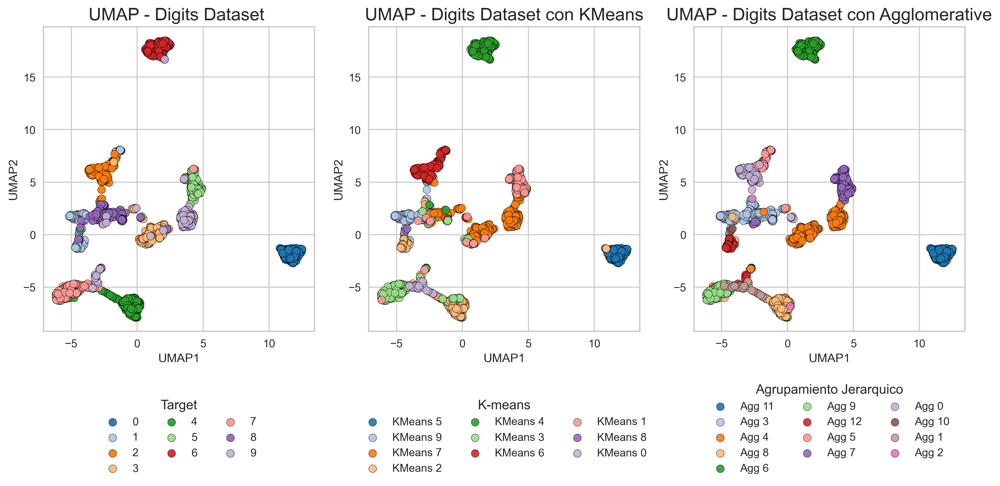

In [112]:
# digits umap
agg_digits = AgglomerativeClustering(n_clusters=13)
kmeans_digits = KMeans(n_clusters=10, random_state=42) # sabemos que k = 10 es bueno por el elbow y silhouette
kmeans_digits.fit(standard_digits)
agg_digits.fit(standard_digits)
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(standard_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target-kmean'] = kmeans_digits.labels_
umap_data_digits['target-agg'] = agg_digits.labels_
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(1,3 ,figsize=(15, 5), dpi = 300)
colors = sns.color_palette("tab20", len(umap_data_digits['target'].unique()))
for c, targ in enumerate(umap_data_digits['target'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target'] == targ]
    ax[0].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
ax[0].set_xlabel('UMAP1')
ax[0].set_ylabel('UMAP2')
ax[0].set_title('UMAP - Digits Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncols = 3)
colors = sns.color_palette("tab20", len(umap_data_digits['target-kmean'].unique()))                 
for c, targ in enumerate(umap_data_digits['target-kmean'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-kmean'] == targ]
    ax[1].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
ax[1].legend(title='K-means', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncols = 3)
ax[1].set_xlabel('UMAP1')
ax[1].set_ylabel('UMAP2')
ax[1].set_title('UMAP - Digits Dataset con KMeans', fontsize=16)    
colors = sns.color_palette("tab20", len(umap_data_digits['target-agg'].unique()))   
for c, targ in enumerate(umap_data_digits['target-agg'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-agg'] == targ]
    ax[2].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'Agg {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
ax[2].legend(title='Agrupamiento Jerarquico', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncols = 3)
ax[2].set_xlabel('UMAP1')
ax[2].set_ylabel('UMAP2')
ax[2].set_title('UMAP - Digits Dataset con Agglomerative', fontsize=16)
plt.show()